In [ ]:
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118


Looking in indexes: https://download.pytorch.org/whl/cu118
INFO: pip is looking at multiple versions of torch to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 85.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 57.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 105.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.1/204.1 MB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 MB 8

In [ ]:
import platform
import tensorflow as tf
import torch
import os

# Cek versi Python
print("Python Version:", platform.python_version())

# Cek GPU yang tersedia
gpu_info = tf.config.list_physical_devices('GPU')
if gpu_info:
    print("\nGPU TensorFlow Info:")
    print(tf.config.experimental.get_device_details(gpu_info[0]))
else:
    print("\nNo GPU available for TensorFlow.")

# Cek GPU untuk PyTorch
if torch.cuda.is_available():
    print("\nPyTorch GPU Info:")
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("GPU Memory:", f"{torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("\nNo GPU available for PyTorch.")

# Cek informasi perangkat keras lainnya
print("\nHardware Info:")
print("Number of CPUs:", os.cpu_count())


Python Version: 3.11.11

GPU TensorFlow Info:
{'compute_capability': (7, 5), 'device_name': 'Tesla T4'}

PyTorch GPU Info:
GPU Name: Tesla T4
GPU Memory: 15.83 GB

Hardware Info:
Number of CPUs: 2


In [11]:
!pip install ultralytics

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="EY2pDRbKs0yScLZ5S4ks")
project = rf.workspace("shootdetectoryolo").project("deteksi-shooting-basket")
version = project.version(11)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 98.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Deteksi-Shooting-basket-11 in yolov8:: 100%|██████████| 1264/1264 [00:00<00:00, 7207.17it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [12]:
from ultralytics import YOLO

# Memuat model YOLOv8m
model = YOLO("yolov8m.pt")  # Bisa diganti dengan model lain: yolov8s.pt, yolov8n.pt, dll

# Melatih model dengan optimizer SGD
results = model.train(
    data="/content/Deteksi-Shooting-basket-11/data.yaml",  # Path ke data.yaml
    epochs=100,                                             # Jumlah epoch pelatihan
    imgsz=640,                                              # Ukuran input gambar
    lr0=0.0001,                                               # Learning rate awal
    momentum=0.999,                                         # Momentum untuk optimizer
    optimizer="SGD",                                        # OPTIMIZER diubah ke Adam
    save=True,                                              # Simpan model
    save_period=10,                                         # Simpan setiap 10 epoch
    name="yolov8m_SGD_lr0.0001_m0.999"                      # Nama eksperimen
)

# Simpan model hasil training (opsional)
model.save("yolov8m_SGD_lr0.0001_m0.999.pt")


Ultralytics 8.3.111 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Deteksi-Shooting-basket-11/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=None, name=yolov8m_SGD_lr0.0001_m0.9992, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

train: Scanning /content/Deteksi-Shooting-basket-11/train/labels.cache... 438 images, 0 backgrounds, 0 corrupt: 100%|██████████| 438/438 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 546.0±325.3 MB/s, size: 53.5 KB)


val: Scanning /content/Deteksi-Shooting-basket-11/valid/labels.cache... 123 images, 0 backgrounds, 0 corrupt: 100%|██████████| 123/123 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8m_SGD_lr0.0001_m0.9992/labels.jpg... 
optimizer: SGD(lr=0.0001, momentum=0.999) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m_SGD_lr0.0001_m0.9992
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.39G      1.442      6.464      1.253         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all        123        182    0.00498     0.0189    0.00335     0.0013



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.31G      1.455      4.414      1.246         16        640: 100%|██████████| 28/28 [00:14<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.136      0.184      0.105     0.0636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.29G      1.228      3.028      1.168          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        123        182      0.927      0.349      0.369      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.19G      1.169      2.428      1.132         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        123        182      0.761      0.406      0.493       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.35G      1.017      1.703      1.035         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        123        182      0.791      0.536      0.631      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.38G     0.9689      1.305      1.028         10        640: 100%|██████████| 28/28 [00:15<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        123        182      0.758      0.639      0.695       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.21G     0.9029      1.111     0.9669          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all        123        182      0.834      0.675      0.755      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.36G     0.9057      1.045     0.9642         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        123        182      0.886      0.708      0.785      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       7.4G     0.8327     0.9102     0.9326         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        123        182      0.821       0.76      0.816      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       6.2G     0.8812     0.8495     0.9537          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        123        182      0.935      0.757      0.846      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      7.35G     0.7911      0.718     0.9227         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        123        182      0.923      0.779      0.856      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.39G     0.8408     0.7088     0.9288         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all        123        182      0.907      0.769      0.857      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       6.2G     0.8329     0.7056     0.9412         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        123        182      0.887        0.8      0.865      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.35G     0.8216     0.6389     0.9254         15        640: 100%|██████████| 28/28 [00:15<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.901      0.824      0.882      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.39G     0.8091     0.6224     0.9157         20        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        123        182      0.895      0.833      0.887      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       6.2G     0.7858     0.5675     0.9139         15        640: 100%|██████████| 28/28 [00:15<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.887      0.844      0.892      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.36G      0.776     0.5633     0.9068         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all        123        182      0.894      0.857      0.902      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.39G     0.7868     0.5324     0.9191         14        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        123        182      0.919      0.837      0.908      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.21G     0.7554     0.4983     0.9026         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.881       0.89      0.913      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.36G     0.7613     0.5115     0.9071         17        640: 100%|██████████| 28/28 [00:15<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        123        182      0.897      0.881      0.915      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       7.4G     0.7626     0.4835      0.898         15        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        123        182      0.893      0.879      0.918      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       6.2G     0.7736     0.5036     0.8988         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.911       0.87       0.92      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.36G     0.7761     0.4707     0.8919         18        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        123        182      0.962      0.837      0.915      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.39G     0.7324     0.4702     0.8896          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        123        182      0.969      0.854      0.924      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.19G     0.7505     0.4701     0.8908         15        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.951      0.857      0.925      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.35G      0.726     0.4681     0.8867         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        123        182      0.931      0.883      0.928       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.39G     0.7393     0.4671     0.8881         15        640: 100%|██████████| 28/28 [00:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.39it/s]

                   all        123        182      0.975       0.87       0.93      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.19G     0.7454     0.5153     0.8952          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        123        182      0.955      0.892      0.939      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.34G      0.713     0.4476     0.8834          6        640: 100%|██████████| 28/28 [00:15<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        123        182      0.958      0.883      0.938      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.38G     0.7411      0.449     0.8916         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]

                   all        123        182      0.955      0.881       0.94      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       6.2G     0.7146     0.4334     0.8805         15        640: 100%|██████████| 28/28 [00:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.39it/s]

                   all        123        182      0.953       0.89      0.942      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.36G     0.7165     0.4395     0.8776         17        640: 100%|██████████| 28/28 [00:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        123        182      0.927      0.929      0.945      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.39G     0.7014     0.4336     0.8708         16        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]

                   all        123        182      0.949      0.929      0.947      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       6.2G     0.7174     0.4465     0.8905         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182       0.98      0.909      0.944      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      7.35G     0.6895     0.4215     0.8659         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        123        182      0.976       0.91      0.943      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.39G     0.7272     0.4567     0.8902         14        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all        123        182      0.964       0.91      0.946      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.19G     0.6896     0.4212      0.866         18        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        123        182      0.958      0.916      0.944      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.35G      0.697     0.4331     0.8788         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        123        182      0.959      0.916      0.948      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.38G     0.6978     0.4182     0.8694         15        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.956      0.916      0.949      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.21G     0.6672      0.412     0.8765         18        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.955       0.92      0.951      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.36G     0.6969     0.4222     0.8725         15        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        123        182      0.954      0.912      0.949      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       7.4G     0.6925     0.4171     0.8736         13        640: 100%|██████████| 28/28 [00:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.952      0.908      0.948      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100       6.2G     0.6953      0.417     0.8809          7        640: 100%|██████████| 28/28 [00:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.952      0.904      0.944      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.36G     0.6987     0.4392     0.8727         13        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.953      0.908      0.942      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.39G     0.7174     0.4302     0.8791          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.945      0.916      0.941      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.21G      0.678     0.4305     0.8677         14        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.941       0.91      0.938      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.36G     0.6759     0.4085     0.8685         14        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.946       0.91      0.937      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       7.4G     0.6702     0.4056     0.8706         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        123        182      0.945      0.916      0.937      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.21G      0.691     0.4304     0.8833         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        123        182      0.937       0.91      0.936      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.36G     0.6864     0.4017     0.8907          5        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        123        182      0.932       0.91      0.935      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100       7.4G     0.6679     0.4042     0.8702         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all        123        182      0.954       0.89      0.942      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.19G     0.6521     0.3878     0.8548          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.969      0.879      0.941      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.35G     0.6729     0.4197     0.8741         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.947      0.889      0.941      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.39G      0.676     0.3908     0.8705          7        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.971      0.877      0.942      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100       6.2G      0.693      0.422     0.8804          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.957      0.887      0.943      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.36G     0.6929     0.4356     0.8813         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]

                   all        123        182      0.931        0.9      0.943      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       7.4G     0.6809     0.4033     0.8604          6        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.921       0.91      0.937      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.21G      0.663     0.4028     0.8597          7        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.913      0.909       0.93      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.36G     0.6819     0.4029     0.8659         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        123        182       0.92      0.897      0.921      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       7.4G     0.6479     0.4179     0.8573          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        123        182      0.915      0.906      0.917        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.22G     0.6586     0.3991     0.8712         18        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.916      0.901      0.923        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.37G     0.6721     0.4091     0.8605         16        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all        123        182      0.914      0.905      0.924        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       6.2G     0.6525     0.3879     0.8539         14        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        123        182      0.921      0.897      0.932        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.36G     0.6387     0.3832     0.8398          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.941      0.877      0.935      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.39G     0.6426     0.3665      0.876         13        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]

                   all        123        182      0.942      0.877      0.935      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.21G     0.6343     0.3829      0.852         18        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.951      0.876      0.931      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.36G     0.6277      0.383     0.8541         19        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.956      0.876      0.928      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       7.4G     0.6434     0.3768     0.8677         16        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  2.00it/s]

                   all        123        182      0.967      0.876      0.928      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.22G     0.6429     0.3876     0.8588         18        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        123        182      0.964      0.881      0.929      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.38G     0.6271     0.3866       0.85          6        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.957      0.881       0.93      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       6.2G     0.6588     0.3761     0.8655         13        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]

                   all        123        182       0.95      0.896      0.932      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.36G     0.6328     0.3759     0.8594          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.942      0.892      0.927      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.39G     0.6294     0.3843     0.8591         19        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.944       0.89      0.922      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.21G     0.6208     0.3739     0.8537          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        123        182      0.927      0.894      0.916      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.36G     0.6263     0.3736     0.8612          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all        123        182      0.928      0.891       0.91      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100       7.4G     0.6184      0.358     0.8532         16        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.923      0.888       0.91       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       6.2G     0.6144     0.3711     0.8491         20        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.17it/s]

                   all        123        182      0.921      0.882       0.91      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.36G     0.6343     0.3593     0.8568         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.932      0.876      0.912      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.39G     0.6162     0.3817     0.8622         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        123        182      0.939      0.882       0.92      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.21G     0.6195     0.3636     0.8577          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.943      0.877      0.917      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.36G     0.6089     0.3683     0.8512         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.945      0.882      0.917      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       7.4G     0.5942     0.3629     0.8592         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182      0.915      0.913      0.918      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.21G     0.6169     0.3538      0.844          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        123        182      0.944      0.888      0.921      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.37G     0.6059      0.372     0.8462         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]

                   all        123        182      0.936      0.903      0.923        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100       7.4G     0.5741      0.344     0.8488         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        123        182      0.923      0.911      0.928      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.23G       0.61     0.3684      0.856         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.924      0.915      0.932      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.38G     0.6212     0.3596     0.8513         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all        123        182       0.92      0.917      0.933      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.21G     0.5869     0.3419     0.8459         14        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        123        182      0.914      0.932      0.934       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.37G     0.5822     0.3444     0.8463         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        123        182      0.905      0.926      0.932       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.21G     0.6147     0.3541     0.8591          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        123        182      0.906      0.933      0.935      0.707


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.36G     0.5962     0.3448     0.8356         10        640: 100%|██████████| 28/28 [00:15<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.939        0.9      0.927      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100       7.4G     0.5762     0.3316     0.8365          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]

                   all        123        182      0.914      0.915      0.922        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       6.2G     0.5864     0.3267     0.8442         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        123        182       0.91      0.915      0.919      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.35G     0.5936     0.3419     0.8448          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all        123        182      0.904      0.913      0.917      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      7.39G     0.5841     0.3343     0.8344          8        640: 100%|██████████| 28/28 [00:14<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        123        182      0.904      0.918      0.915      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.21G     0.5761     0.3263     0.8375         12        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.903      0.911      0.914      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.36G     0.5918     0.3214     0.8374         11        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        123        182      0.909      0.916      0.915        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       7.4G      0.574     0.3227     0.8308          6        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.907      0.911      0.915      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       6.2G     0.5637     0.3204     0.8251         10        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.903      0.915      0.917        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.35G     0.5881      0.324     0.8329          9        640: 100%|██████████| 28/28 [00:14<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        123        182      0.907      0.904      0.917      0.702



100 epochs completed in 0.507 hours.
Optimizer stripped from runs/detect/yolov8m_SGD_lr0.0001_m0.9992/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolov8m_SGD_lr0.0001_m0.9992/weights/best.pt, 52.0MB

Validating runs/detect/yolov8m_SGD_lr0.0001_m0.9992/weights/best.pt...
Ultralytics 8.3.111 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.24it/s]


                   all        123        182      0.971      0.877      0.942      0.718
            Basketball         76         76      0.945      0.763      0.889      0.581
       Basketball Hoop        106        106      0.996      0.991      0.995      0.856
Speed: 0.2ms preprocess, 11.4ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to runs/detect/yolov8m_SGD_lr0.0001_m0.9992


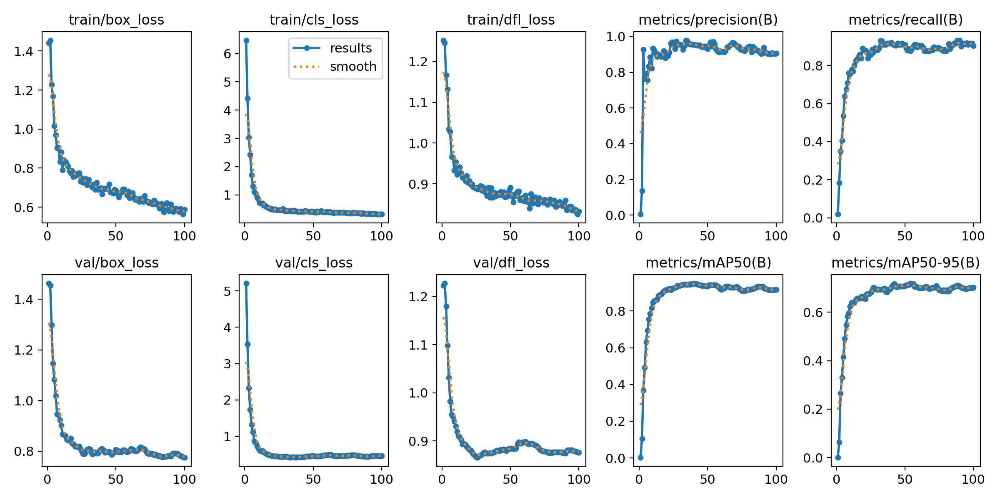

In [ ]:
import os
from IPython.display import Image as IPyImage

# Path ke folder hasil training
train_folder = "runs/detect/yolov8m_SGD_lr0.0001_m0.999"  # Sesuaikan jika path berbeda

# Path ke file results.png
results_image_path = os.path.join(train_folder, "results.png")

# Periksa keberadaan file dan tampilkan
if os.path.exists(results_image_path):
    display(IPyImage(filename=results_image_path, width=600))
else:
    print("File 'results.png' tidak ditemukan. Pastikan proses training selesai dan file tersedia.")


In [14]:
from ultralytics import YOLO

# Load model hasil training
model = YOLO("runs/detect/yolov8m_SGD_lr0.0001_m0.9992/weights/best.pt")

# Jalankan inferensi pada folder test
results = model.predict(source="/content/Deteksi-Shooting-basket-11/test/images", save=True)



image 1/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0007_jpg.rf.c50d8e04c5c44c5adfc637292629977f.jpg: 640x640 1 Basketball, 37.0ms
image 2/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0009_jpg.rf.dae8363a59687ed34abdebd3f28a2d5e.jpg: 640x640 2 Basketballs, 36.8ms
image 3/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0011_jpg.rf.3b14dc8329870a55746c44080f943429.jpg: 640x640 (no detections), 28.1ms
image 4/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0025_jpg.rf.ef50d41096b536faccfd21daeb1014f1.jpg: 640x640 1 Basketball, 28.1ms
image 5/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0038_jpg.rf.1ca1d18eb48a23955391642020b913d8.jpg: 640x640 2 Basketballs, 1 Basketball Hoop, 28.1ms
image 6/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0047_jpg.rf.b66d7d10aaaa84c25e8101dd5997cb7c.jpg: 640x640 1 Basketball, 28.1ms
image 7/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0048_jpg.rf.553f649e151e562f4798c8ee68f3a970.j

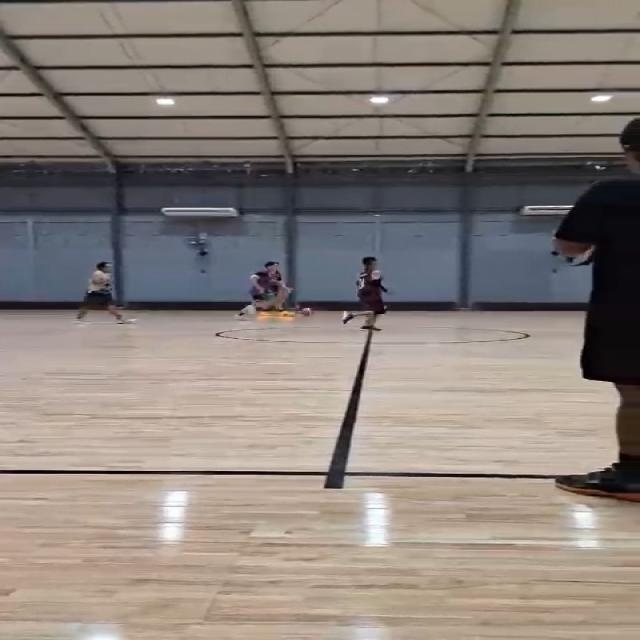

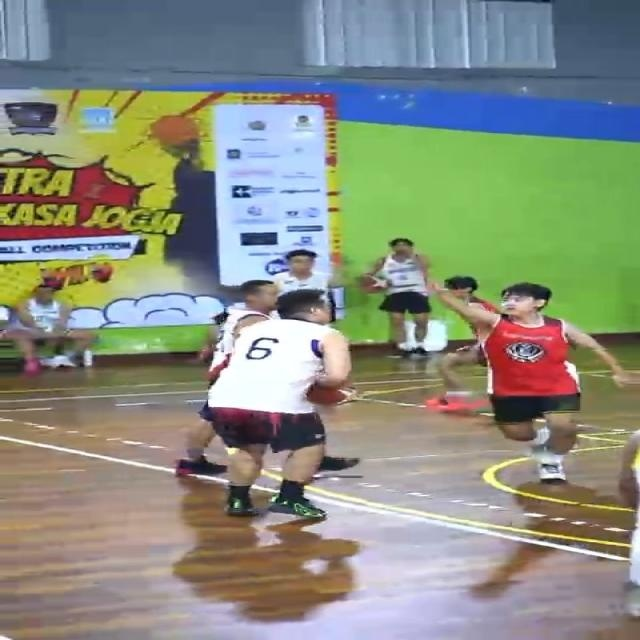

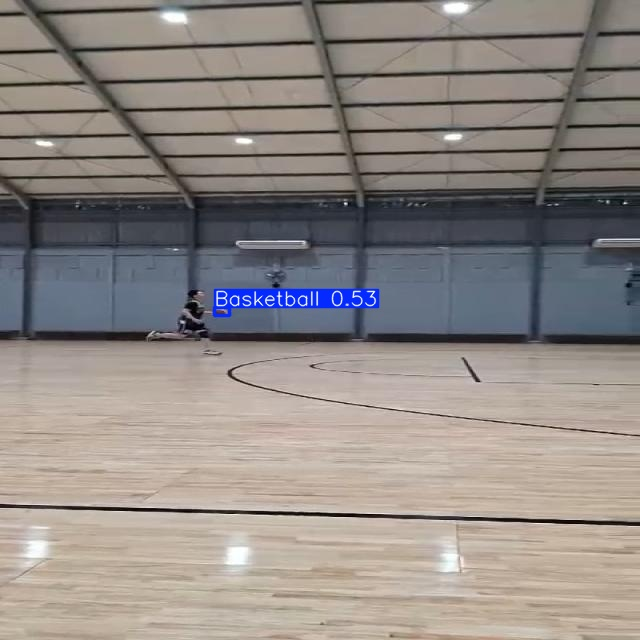

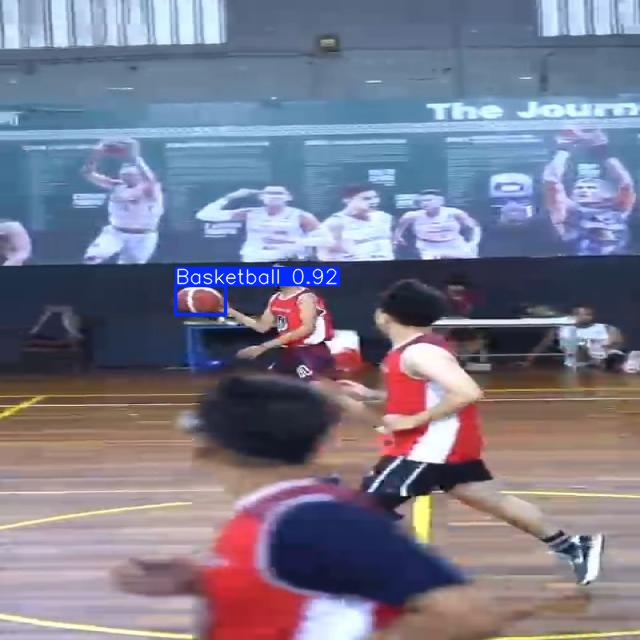

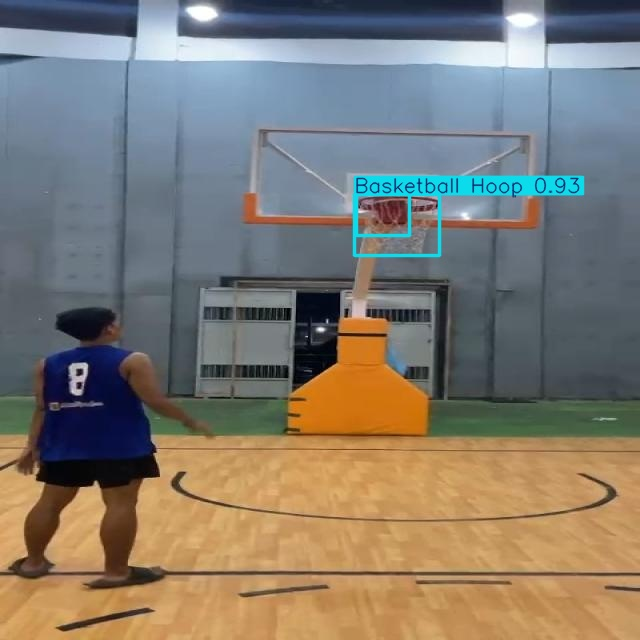

...

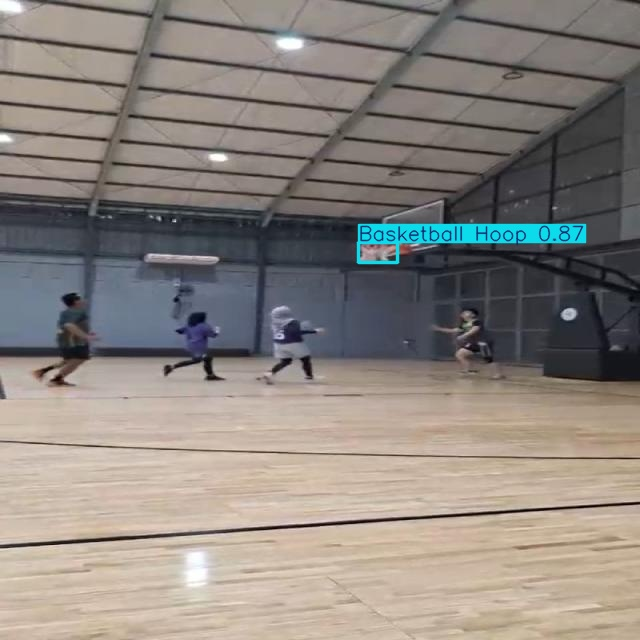

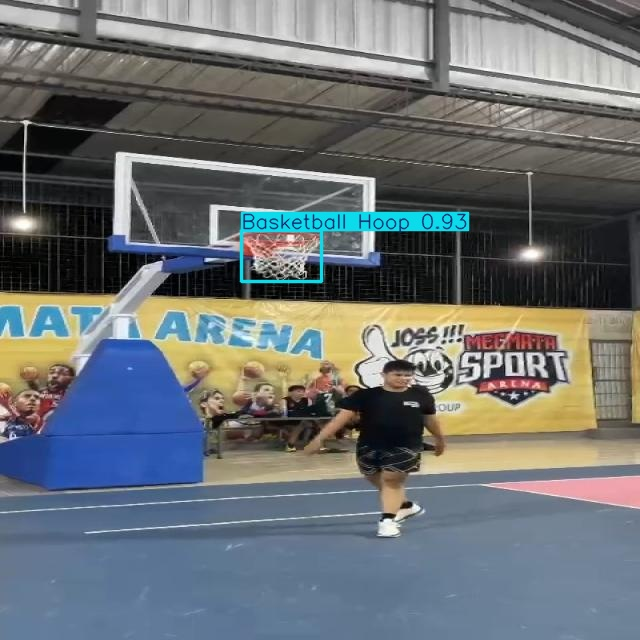

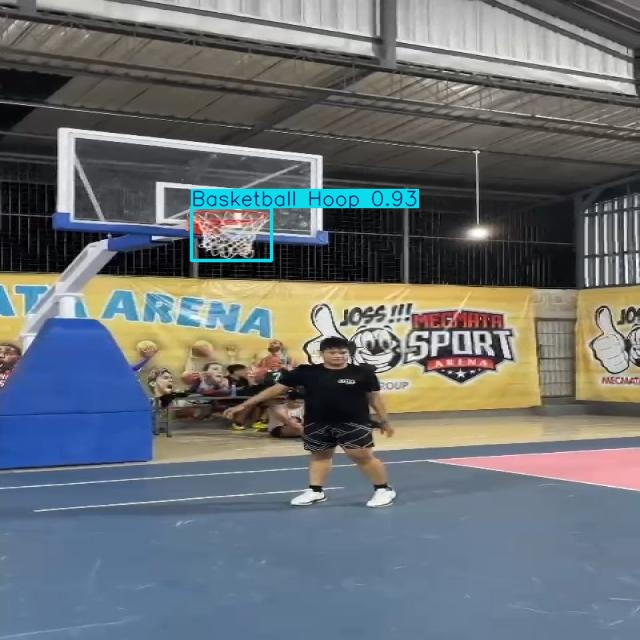

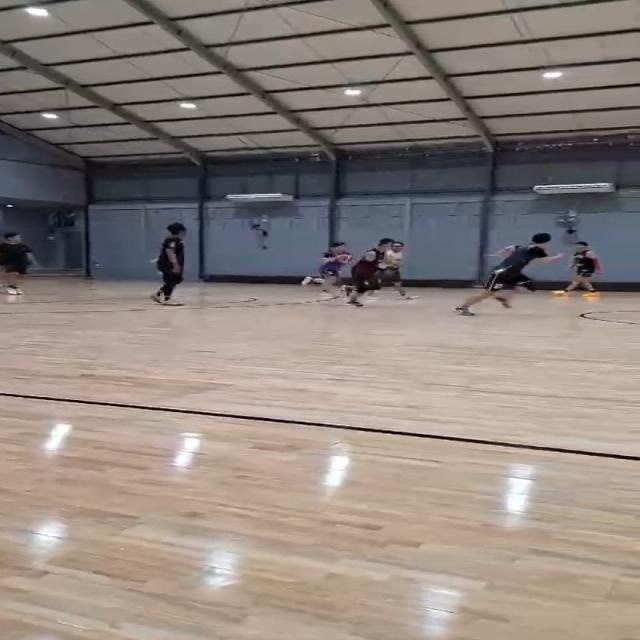

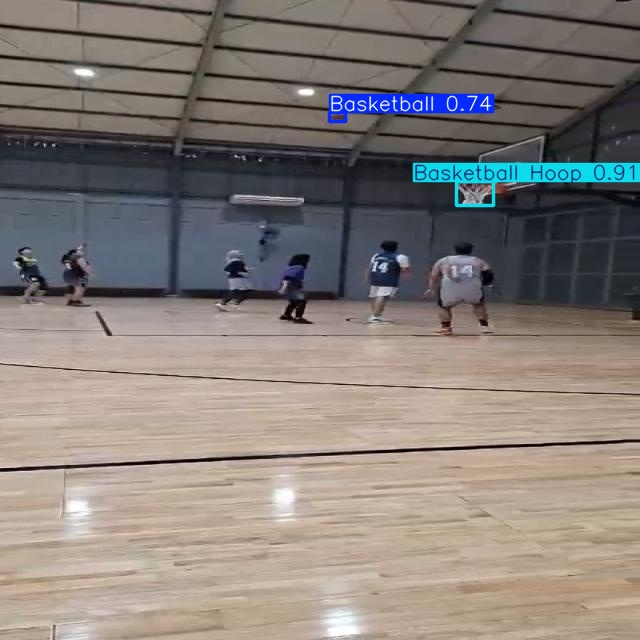

In [15]:
import os
from IPython.display import Image, display

# Path hasil prediksi
pred_path = "runs/detect/predict3"

# Tampilkan semua gambar hasil prediksi
for img_file in os.listdir(pred_path):
    if img_file.endswith(".jpg") or img_file.endswith(".png"):
        display(Image(filename=os.path.join(pred_path, img_file), width=800))


In [ ]:
from ultralytics import YOLO
import cv2

# Memuat model
model = YOLO('E:\KULIAH\SKRIPSI\PROGRAM/yolov8m_SGD_lr0.0001_m0.999.pt')

# Input dan output video
input_video = 'E:\KULIAH\SKRIPSI\PROGRAM\Bangteo2.mp4'
cap = cv2.VideoCapture(input_video)

# Memeriksa apakah video berhasil dibuka
if not cap.isOpened():
    print("Error: Tidak dapat membuka video")
    exit()

# Properti Video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Output video
output_video = 'E:\KULIAH\SKRIPSI\PROGRAM\OUTPUT FIX\ini nyoba program baru\Output_Bangteo2_yolov8m_SGD_lr0.0001_m0.999.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video, fourcc, fps, (frame_width, frame_height))

# Variabel untuk melacak lintasan bola, posisi ring, skor, dan percobaan
basket_trajectory = []
ring_position = None
score = 0
attempts = 0
MAX_TRAJECTORY_POINTS = 15

# Untuk rata-rata confidence
basketball_confidences = []
hoop_confidences = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)

    for result in results:
        for box in result.boxes:
            confidence = float(box.conf)
            x1, y1, x2, y2 = box.xyxy[0].int().tolist()
            class_id = int(box.cls)
            class_names = ['basketball', 'basketball hoop']

            if class_id < len(class_names):
                label = class_names[class_id]

                # Threshold
                if label == 'basketball' and confidence < 0.80:
                    continue
                if label == 'basketball hoop' and confidence < 0.80:
                    continue

                color = (0, 255, 0) if label == 'basketball' else (255, 0, 0)
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, f"{label} {confidence:.2f}", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                if label == 'basketball':
                    ball_center = ((x1 + x2) // 2, (y1 + y2) // 2)
                    basket_trajectory.append(ball_center)

                    if len(basket_trajectory) > MAX_TRAJECTORY_POINTS:
                        basket_trajectory.pop(0)

                    for point in basket_trajectory:
                        cv2.circle(frame, point, 3, (0, 255, 255), -1)

                    basketball_confidences.append(confidence)

                elif label == 'basketball hoop':
                    ring_position = (x1, y1, x2, y2)
                    hoop_confidences.append(confidence)

    # Cek dan gambar posisi ring
    if ring_position:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4
        # cv2.line(frame, (x1, ring_bottom_y), (x2, ring_bottom_y), (0, 0, 255), 2)

    # Deteksi tembakan masuk
    if ring_position and len(basket_trajectory) > 1:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4
        Xr1 = x1
        Xr2 = x2

        for i in range(1, len(basket_trajectory)):
            prev_y = basket_trajectory[i - 1][1]
            curr_y = basket_trajectory[i][1]
            prev_x = basket_trajectory[i - 1][0]
            curr_x = basket_trajectory[i][0]

            if prev_y < ring_bottom_y and curr_y >= ring_bottom_y:
                attempts += 1
                if curr_x < Xr1 or curr_x > Xr2:
                    print("Tembakan keluar dari batas kiri/kanan ring!")
                    basket_trajectory = []
                    break

                score += 1
                print(f"Tembakan masuk! Skor saat ini: {score}, Percobaan: {attempts}")
                basket_trajectory = []
                break

    fg_percentage = (score / attempts * 100) if attempts > 0 else 0.00

    # Rata-rata confidence
    avg_basketball_conf = sum(basketball_confidences) / len(basketball_confidences) if basketball_confidences else 0.0
    avg_hoop_conf = sum(hoop_confidences) / len(hoop_confidences) if hoop_confidences else 0.0

    # Tampilkan hasil di frame
    cv2.putText(frame, f"Score: {score} | Attempts: {attempts} | FG%: {fg_percentage:.2f}%", 
                (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (8, 255, 255), 2)

    cv2.putText(frame, f"Avg Basketball Conf: {avg_basketball_conf:.2f}", 
                (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    cv2.putText(frame, f"Avg Hoop Conf: {avg_hoop_conf:.2f}", 
                (10, 80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    out.write(frame)
    cv2.imshow('Detection', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video telah diproses dan disimpan sebagai {output_video}")


WARNING  Python>=3.10 is required, but Python==3.9.13 is currently installed 

0: 640x384 1 Basketball, 1 Basketball Hoop, 341.2ms
Speed: 9.9ms preprocess, 341.2ms inference, 15.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 244.7ms
Speed: 2.6ms preprocess, 244.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 239.8ms
Speed: 3.0ms preprocess, 239.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 251.4ms
Speed: 2.5ms preprocess, 251.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 250.5ms
Speed: 3.1ms preprocess, 250.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 249.7ms
Speed: 2.5ms preprocess, 249.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 B

# INI PAKE LINEAR TRENDLINE


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np

# Memuat model
model = YOLO('E:\KULIAH\SKRIPSI\PROGRAM/yolov8m_SGD_lr0.0001_m0.999.pt')

# Input dan output video
input_video = 'E:\KULIAH\SKRIPSI\PROGRAM\Bangteo2.mp4'
cap = cv2.VideoCapture(input_video)

# Properti Video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Output video
output_video = 'E:\KULIAH\SKRIPSI\PROGRAM\OUTPUT FIX\INI PAKE LINEAR TRENDLINE\Output_YOLOv8m_lr0.0001_m0999.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video, fourcc, fps, (frame_width, frame_height))

# Variabel untuk melacak lintasan bola dan trendline
lintasan_bolaBasket = []
ring_position = None
score = 0
attempts = 0
MAX_Titik_Lintasan = 15  # Jumlah maksimum titik lintasan yang disimpan

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)

    for result in results:
        for box in result.boxes:
            confidence = float(box.conf)
            x1, y1, x2, y2 = box.xyxy[0].int().tolist()
            class_id = int(box.cls)
            class_names = ['basketball', 'basketball hoop']

            if class_id < len(class_names):
                label = class_names[class_id]

                # Threshold confidence
                if confidence < 0.80:
                    continue

                color = (0, 255, 0) if label == 'basketball' else (255, 0, 0)
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, f"{label} {confidence:.2f}", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                if label == 'basketball':
                    ball_center = ((x1 + x2) // 2, (y1 + y2) // 2)
                    lintasan_bolaBasket.append(ball_center)

                    if len(lintasan_bolaBasket) > MAX_Titik_Lintasan:
                        lintasan_bolaBasket.pop(0)

                    # Gambar titik lintasan
                    for point in lintasan_bolaBasket:
                        cv2.circle(frame, point, 3, (0, 255, 255), -1)

                    # Hitung linear trendline jika ada cukup titik
                    if len(lintasan_bolaBasket) >= 2:
                        x = np.array([p[0] for p in lintasan_bolaBasket])
                        y = np.array([p[1] for p in lintasan_bolaBasket])
                        A = np.vstack([x, np.ones(len(x))]).T
                        m, c = np.linalg.lstsq(A, y, rcond=None)[0]

                        # Gambar trendline (merah)
                        start_x = x[0]
                        end_x = x[-1] + 50  # Perpanjang 50 piksel ke depan
                        cv2.line(frame, 
                                 (int(start_x), int(m * start_x + c)),
                                 (int(end_x), int(m * end_x + c)),
                                 (0, 0, 255), 2)

                        # Prediksi posisi berikutnya (hijau)
                        predicted_x = x[-1] + 20
                        predicted_y = m * predicted_x + c
                        cv2.circle(frame, (int(predicted_x), int(predicted_y)), 5, (0, 255, 0), -1)

                elif label == 'basketball hoop':
                    ring_position = (x1, y1, x2, y2)

    # Deteksi tembakan masuk (logika asli Anda)
    if ring_position and len(lintasan_bolaBasket) > 1:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4

        for i in range(1, len(lintasan_bolaBasket)):
            prev_y = lintasan_bolaBasket[i-1][1]
            curr_y = lintasan_bolaBasket[i][1]
            curr_x = lintasan_bolaBasket[i][0]

            if prev_y < ring_bottom_y and curr_y >= ring_bottom_y:
                attempts += 1
                if x1 <= curr_x <= x2:
                    score += 1
                lintasan_bolaBasket = []
                break

    # Tampilkan skor
    fg_percentage = (score / attempts * 100) if attempts > 0 else 0.0
    cv2.putText(frame, f"Score: {score} | Attempts: {attempts} | FG%: {fg_percentage:.2f}%", 
                (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)

    out.write(frame)
    cv2.imshow('Deteksi yolov8m_SGD_lr0.0001_m0.999', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

WARNING  Python>=3.10 is required, but Python==3.9.13 is currently installed 

0: 640x384 1 Basketball, 1 Basketball Hoop, 3490.3ms
Speed: 11.6ms preprocess, 3490.3ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1848.0ms
Speed: 9.8ms preprocess, 1848.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1584.5ms
Speed: 4.6ms preprocess, 1584.5ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1366.5ms
Speed: 6.1ms preprocess, 1366.5ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1660.3ms
Speed: 6.6ms preprocess, 1660.3ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1369.6ms
Speed: 9.8ms preprocess, 1369.6ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 384)

0: